<h1 align="center"><span style="color: #004488">Convolutional Neural Network (CNN) per il riconoscimento e la classificazione di gemme </span></h1>

<h2><span style="color:#117777">Introduzione e obiettivi</span></h2>

Il progetto si pone l'obiettivo di sviluppare un sistema per il riconoscimento di **gemme lavorate**, quindi pietre preziose e semi preziose, al fine di classificarle.

Verrà utilizzata una **Convolutional Neural Network**, ovvero un'architettura di rete per il Deep Learning che sfrutta principalmente due tecniche, convoluzione e sottocampionamento (o pooling), che prendono spunto dagli studi fatti sulla corteccia visiva e cercano di simulare quello che succede nel **cervello umano**. Infatti, quando guardiamo un’immagine nella vita reale, analizziamo in maniera inconscia o meno dettagli sempre più minuziosi, che ci permettono di capire di che oggetto si tratta o di riconoscere persone specifiche.

Alla stessa maniera la convoluzione ed il pooling cercano, rispettivamente, di definire l’importanza dei vari pixel dell’immagine e selezionano solo quelli considerati più rilevanti.

Implementeremo prima una rete neurale molto semplice, poi cercheremo di migliorarne le prestazioni aumentandone la **profondità**, calibrando gli **iperparametri** del modello e provando ad applicare tecniche di **data augmentation** ai dati in fase di costruzione del modello.

Il dataset, disponibile [qui](https://www.kaggle.com/datasets/fransell/gemstones-images-expanded "dataset"), è una versione rivista, corretta ed **arricchita** di un [altro dataset](https://www.kaggle.com/datasets/lsind18/gemstones-images "dataset originario"), usato come base. Il dataset definitivo consiste di **88 classi** di gemme, con 50 foto per ciascuna classe ed un totale di 4400 immagini.
Inoltre, a seguito dell'arricchimento del dataset, si è anche tentato di apportare le seguenti trasformazioni:
- rimozione dello sfondo a tutte le immagini contenute nel dataset, con la sostituizione di uno sfondo a tinta unita, ad esempio bianco o grigio
- risconocimento dei bordi al fine di ritagliare l'immagine intorno al soggetto ed escludere le zone ininfluenti per la classificazione

**Si anticipa che gli approcci citati non hanno apportato miglioramenti significativi rispetto a quanto esposto nelle conclusioni.**

I due dataset modificati sono stati caricati sul mio profilo [GitHub](https://github.com/fransell/gemstones-cnn), insieme al relativo codice utilizzato per generarli.
La rimozione dello sfondo sulle 4400 immagini ha richiesto circa 2 ore, mentre il ritaglio lungo i bordi soltanto qualche secondo. Le due elaborazioni sostituiscono le immagini modificate a quelle di partenza, direttamente nel dataset dato in pasto agli algoritmi.

Discuteremo i limiti che tale architettura può avere se applicata ad un dataset relativamente piccolo e che consiste di tante classi, alcune molto simili tra di loro ed indistinguibili dalle sole immagini anche per l'occhio umano.

<h2><span style="color:#117777">1 - Librerie</span></h2>

Come primo passo, importiamo le librerie necessarie.

In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
import os
import pathlib

import PIL

import cv2

import tensorflow as tf
print("TensorFlow version:", tf.__version__)

from tensorflow.keras import Model

TensorFlow version: 2.10.1


In [2]:
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow import keras
from tensorflow.keras import datasets, layers, models

In [3]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn import metrics

In [4]:
import random

In [5]:
pip install split-folders

Note: you may need to restart the kernel to use updated packages.


In [6]:
import shutil
import splitfolders

<h2><span style="color:#117777">2 - Creazione del dataset</span></h2>

Il dataset ha una struttura abbastanza lineare, ovvero è costituito da un elenco di cartelle, ancora non divise in train, validation e test set, contenenti ciascuna 50 immagini. Il nome della cartella corrisponde alla gemma contenuta all'interno.

Per rendere il tutto il più casuale possibile, ci avvarremo di **splitfolders**, una libreria concepita proprio per dividere un dataset in training, test e validation set in modo casuale e dipendente dal seed specificato. Specificheremo gli argomenti in modo che il dataset sia diviso in 80% training, 10% validation e 10% test.

Una volta creata la suddivisione su disco, generiamo il dataset utilizzando TensorFlow, in particolare il metodo **tf.keras.utils.image_dataset_from_directory()**, che si rivela particolarmente utile nel caso in cui la struttura del dataset, come in questo caso, è del tipo:

    main_directory/
    ...class_a/
    ......a_image_1.jpg
    ......a_image_2.jpg
    ...class_b/
    ......b_image_1.jpg
    ......b_image_2.jpg

La chiamata a questo metodo restituisce un **tf.data.Dataset**, che produce batch di immagini (il numero delle immagine per ciascuno è determinato dal batch_size impostato) dalle sottodirectory, insieme alle relative etichette (numeri interi da 0 ad 87 che identificano le 88 classi).

In [7]:
dataset_url_exp = 'dataset-expanded' # Dataset di 4400 immagini

dataset_url_nobg = 'dataset-nobg' # Dataset con le immagini su sfondo bianco
dataset_url_cropped = 'dataset-cropped' # Dataset con le immagini ritagliate intorno al soggetto

# Definiamo una funzione che ci permette di splittare il dataset in train, validation e test set

def split_dataset(dataset_url, split=False):
    print("Split impostato su: {}".format(split))
    if(split == True):
        data_dir = pathlib.Path(dataset_url)
        # Eliminazione della cartella dataset-splitted se esistente
        try:
            shutil.rmtree(pathlib.Path('dataset-splitted'))
            print("Cartella eliminata")
        except:
            print("Cartella non esistente")

        output = "dataset-splitted"

        splitfolders.ratio(dataset_url, output=output, seed=42, ratio=(0.8, 0.1, 0.1))

In [8]:
# Se split viene impostato a true riesegue la divisione del dataset e la salva nella cartella dataset-splitted
# In dataset-splitted avremo 3 cartelle: train, val e test

split_dataset(dataset_url_exp, True)
#split_dataset(dataset_url_exp)

Split impostato su: True
Cartella non esistente


Copying files: 4400 files [00:30, 143.57 files/s]


In [9]:
dataset_train_url = 'dataset-splitted/train'
dataset_val_url = 'dataset-splitted/val'
dataset_test_url = 'dataset-splitted/test'

data_train_dir = pathlib.Path(dataset_train_url)
data_val_dir = pathlib.Path(dataset_val_url)
data_test_dir = pathlib.Path(dataset_test_url)

image_train_count = len(list(data_train_dir.glob('*/*.jpg')))
print('Il train set è composto da un totale di {} immagini.'.format(image_train_count))

image_val_count = len(list(data_val_dir.glob('*/*.jpg')))
print('Il validation set è composto da un totale di {} immagini.'.format(image_val_count))

image_test_count = len(list(data_test_dir.glob('*/*.jpg')))
print('Il test set è composto da un totale di {} immagini.'.format(image_test_count))

Il train set è composto da un totale di 3520 immagini.
Il validation set è composto da un totale di 440 immagini.
Il test set è composto da un totale di 440 immagini.


Esploriamo il dataset provando ad estrarre alcune immagini.

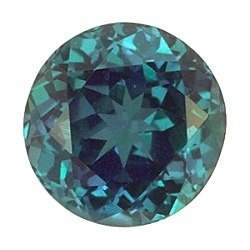

In [10]:
alexandrite = list(data_train_dir.glob('Alexandrite/*'))
PIL.Image.open(str(alexandrite[5]))

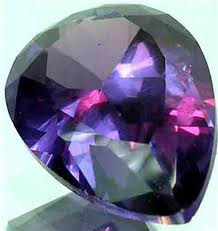

In [11]:
PIL.Image.open(str(alexandrite[2]))

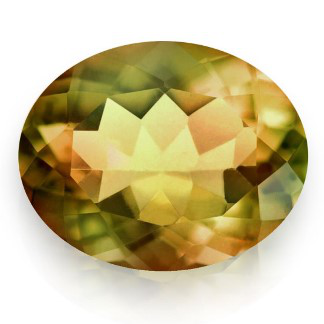

In [12]:
andalusite = list(data_train_dir.glob('Andalusite/*'))
PIL.Image.open(str(andalusite[20]))

Impostiamo i valori per il **batch_size** e per il **ridimensionamento** delle immagini.

Il batch_size è un iperparametro del modello. Indica il numero di esempi di addestramento che vengono passati al modello prima che i gradienti vengano calcolati ed i pesi del modello aggiornati.

In [13]:
batch_size = 32
img_height = 220
img_width = 220
input_shape = (img_height, img_width, 3)

Impostando **crop_to_aspect_ratio = True** ci assicuriamo che il ridimensionamento delle immagini non alteri le proporzioni.

In [14]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    data_train_dir,
    #validation_split = 0.2,
    #subset = "training",
    seed = 42,
    shuffle = True, # le immagini nei batch vengono scelte in modo casuale
    image_size = (img_height, img_width),
    batch_size = batch_size,
    #interpolation = 'area',
    crop_to_aspect_ratio = True
)

Found 3520 files belonging to 88 classes.


In [15]:
val_ds = tf.keras.utils.image_dataset_from_directory(
    data_val_dir,
    #data_train_dir,
    #validation_split = 0.2,
    #subset = "validation",
    shuffle = True,
    seed = 234,
    image_size = (img_height, img_width),
    batch_size = batch_size,
    #interpolation = 'area',
    crop_to_aspect_ratio = True
)

Found 440 files belonging to 88 classes.


In [16]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    data_test_dir,
    image_size = (img_height, img_width),
    batch_size = batch_size,
    #interpolation = 'area',
    crop_to_aspect_ratio = True
)

Found 440 files belonging to 88 classes.


In [17]:
class_names = train_ds.class_names
num_classes = len(class_names)
print('Il numero di classi che stiamo considerando è: {}'.format(num_classes))

print('\nClassi nel dataset:\n\n{}'.format(class_names))

Il numero di classi che stiamo considerando è: 88

Classi nel dataset:

['Alexandrite', 'Almandine', 'Amazonite', 'Amber', 'Amethyst', 'Ametrine', 'Andalusite', 'Andradite', 'Aquamarine', 'Aventurine Green', 'Aventurine Yellow', 'Benitoite', 'Beryl Golden', 'Bixbite', 'Bloodstone', 'Blue Lace Agate', 'Brazilianite', 'Carnelian', 'Cats Eye', 'Chalcedony', 'Chalcedony Blue', 'Chrome Diopside', 'Chrysoberyl', 'Chrysocolla', 'Chrysoprase', 'Citrine', 'Coral', 'Danburite', 'Diamond', 'Diaspore', 'Dumortierite', 'Emerald', 'Fluorite', 'Garnet Red', 'Goshenite', 'Grossular', 'Hessonite', 'Hiddenite', 'Iolite', 'Jade', 'Jasper', 'Kunzite', 'Kyanite', 'Labradorite', 'Lapis Lazuli', 'Larimar', 'Malachite', 'Moonstone', 'Morganite', 'Onyx Black', 'Onyx Green', 'Onyx Red', 'Opal', 'Pearl', 'Peridot', 'Prehnite', 'Pyrite', 'Pyrope', 'Quartz Beer', 'Quartz Lemon', 'Quartz Rose', 'Quartz Rutilated', 'Quartz Smoky', 'Rhodochrosite', 'Rhodolite', 'Rhodonite', 'Ruby', 'Sapphire Blue', 'Sapphire Pink', '

Costruiamo ora un **campionario** contenente un'immagine esemplificativa per ciascuna classe del dataset. Sarà utilizzato più avanti per visualizzare l'accuratezza delle predizioni e la somiglianza tra le gemme nelle prime n posizioni di ciascuna classificazione effettuata dal modello.

In [18]:
path_images = dataset_train_url + '/'

images = [] 
for label in class_names:
    image_dir = pathlib.Path(path_images + label)
    name_image = random.choice(os.listdir(image_dir))
    chosen_image_path = pathlib.Path(path_images + label + '/' + name_image)
    images.append(PIL.Image.open(chosen_image_path))

In [19]:
campionario = dict(zip(class_names, images))

Stampiamo il campionario costruito, in modo da visualizzare velocemente un esempio per ciascuna classe ed avere un colpo d'occhio delle somiglianze esistenti. Si evidenzia già ora come alcune pietre presentino fenomeni di iridescenza, cambio di colore, e che anche il taglio e la rifrazione della luce possano, in alcune occasioni, aggiungere ambiguità.

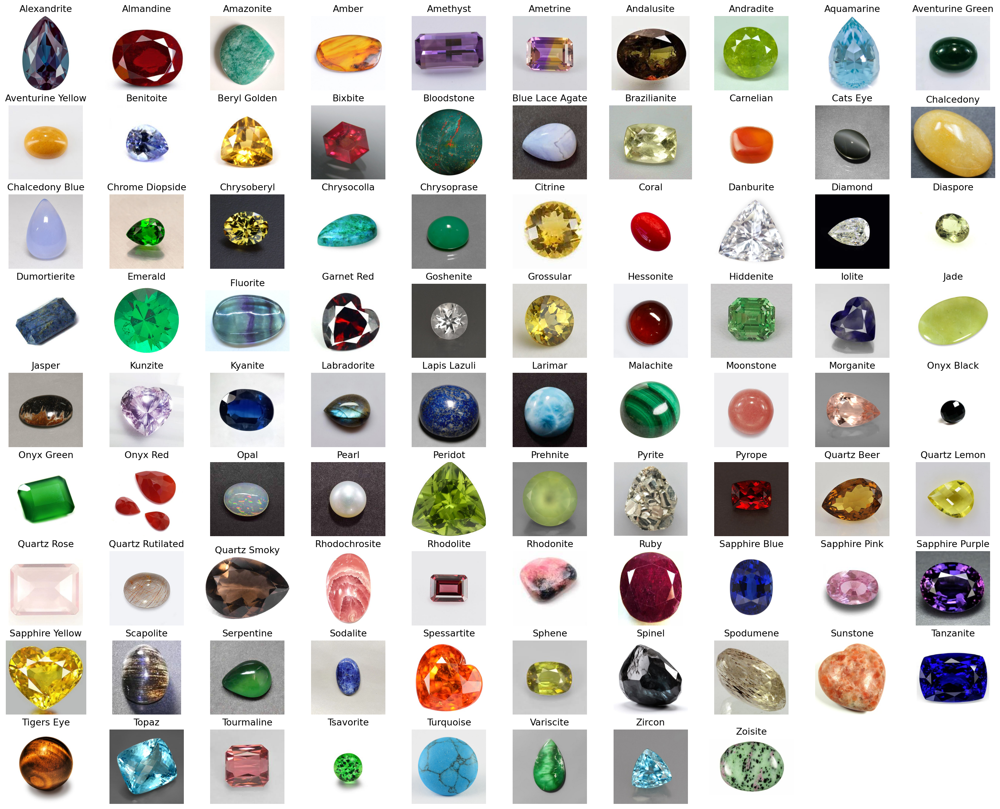

In [20]:
plt.figure(figsize=(25,20), dpi=150)
for i in range(len(campionario)):
    plt.subplot(9, 10, i + 1)
    plt.title(list(campionario.keys())[i], fontsize = 13)
    plt.imshow(list(campionario.values())[i])
    plt.axis("off")

Il train_ds è suddiviso in batch di coppie (immagini, etichette), tutte della forma:

In [21]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(32, 220, 220, 3)
(32,)


<h2><span style="color:#117777">3 - Normalizzazione dei dati</span></h2>

I valori del canale RGB sono compresi nell'intervallo [0, 255]. 

**Standardizziamo** i valori in modo che rientrino nell'intervallo [0, 1] usando **tf.keras.layers.Rescaling**.

Utilizzeremo questo metodo quando implementeremo il modello.

Normalizzare i dati presenza dei vantaggi, tra i quali:

- **stabilità numerica**: ridimensionando i valori RGB in un intervallo compreso tra 0 e 1, si evitano potenziali problemi di instabilità numerica che potrebbero verificarsi quando si lavora con valori grandi.

- **convergenza più rapida**: la normalizzazione dei valori RGB spesso aiuta a ottenere una convergenza più rapida durante il processo di training, in particolare se si utilizzano tecniche di discesa del gradiente.

In [22]:
normalization_layer = layers.Rescaling(1./255)

<h2><span style="color:#117777">4 - Utilizzo di una GPU per aumentare la potenza di calcolo</span></h2>

Qualora si abbia a disposizione una scheda video, è possibile utilizzarla per aumentare la velocità di addestramento del modello.

Affinchè questo sia possibile sulla macchina in uso devono essere soddisfatte le seguenti condizioni:
- la macchina deve possedere una scheda video supportata
- in caso di GPU Nvidia devono essere installate le librerie apposite, in questo caso CUDA e CUDNN
- la versione di TensorFlow dovrà contenere il supporto per l'utilizzo della GPU (attualmente l'ultima versione che lo supporta nativamente su Windows è la 2.10.1)

Utilizzando la GPU i tempi di addestramento si sono ridotti a circa 1/5 rispetto al solo utilizzo della CPU. Questo ha permesso di addestrare e sperimentare più modelli in tempi più brevi.

In [23]:
print(tf.test.is_built_with_cuda())
print(tf.config.list_physical_devices('GPU'))

True
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


<h2><span style="color:#117777">5 - Implementazione di una rete neurale convolutiva</span></h2>

<h3><span style="color:#117777">5.1 - Funzionamento generale di una CNN </span></h3>

Una **CNN** (rete neurale convolutiva) è in grado di estrarre in maniera automatica le caratteristiche rilevanti di un dato fornito in ingresso e di apprenderne i pattern. Questo la rende un'architettura particolarmente adatta all'apprendimento di immagini.

Una qualsiasi CNN ha una struttura a blocchi:

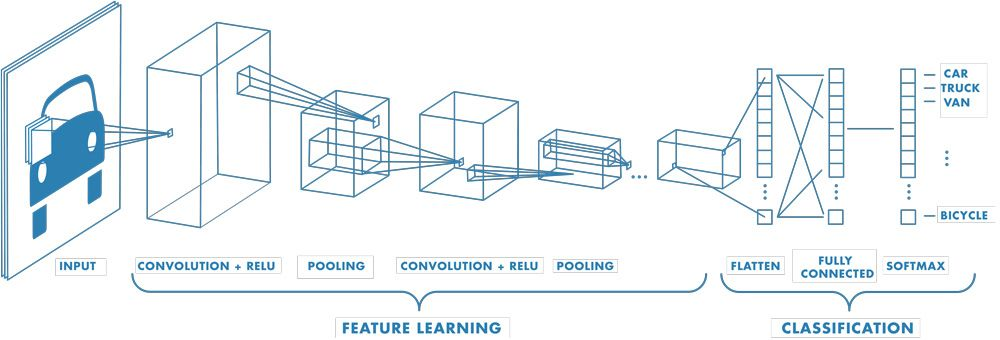

I livelli possono essere anche decine o centinaia ed ognuno di questi impara a rilevare feature diverse di un'immagine.

Il livello di input è  costuituito da una sequenza  di neuroni in grado di ricevere le informazioni dell’immagine da trattare. A questo livello verrà passato il vettore di dati che rappresenta i pixel dell’immagine di ingresso. Nel caso, ad esempio, di una immagine a colori di 220 x 220  pixel il vettore di ingresso dovrà avere dimensione  220 x 220 x 3: per ogni pixel dell’immagine di dimensione  220 x 220 avremo 3 valori che rapprensentano  i tre colori dell’immagine in formato RGB  (Red, Green e Blue).

Lo strato convoluzionale è l'elemento fondamentale della rete e quello dove avviene la maggior parte dei calcoli. Il suo obiettivo è quello di individuare schemi, come ad esempio curve, angoli, circonferenze o quadrati raffigurati in un’immagine con elevata precisione.

Nella pratica il processo consiste nel far scorrere un kernel, ovvero una matrice *k x k* dei pesi, sulla larghezza e sull'altezza dell'immagine. In più iterazioni il kernel avrà "analizzato" l'intera immagine. In ciasuna posizione viene calcolato il prodotto scalare tra i pesi del kernel (che in una CNN sono parametri del modello) ed il valore dei pixel della porzione di immagine sottostante il kernel. Questa operazione trasforma l'immagine di input in un insieme di caratteristiche convolutive, ciascuna delle quali rappresenta la presenza e l'intensità di una determinata caratteristica in vari punti dell'immagine.

Le CNN spesso includono più livelli convoluzionali impilati: nei primi livelli la rete cercherà di apprendere le caratteristiche più elementari, per poi passare a quelle più complesse man mano che ci si scende in profondità nella rete, fino a riuscire ad identificare l'oggetto nella sua complessità.

Dopo ogni operazione di convoluzione, viene applicata una trasformazione ReLU, che introduce la non linearità del modello e consente di procedere ad un addestramento più rapido ed efficace mappando i valori negativi a zero e mantenendo quelli positivi. Questa operazione è definita attivazione, dal momento che solo le feature attivate vengono trasmesse al layer successivo.

I livelli di sottocampionamento (polling) eseguono la riduzione della dimensionalità: similmente al livello convoluzionale, le operazioni effettuate in questi layer implicano un processo di scansione attraverso l'immagine di input, ma con con la funzione di conservare solo le informazioni ritenute più caratteristiche.

Esistono due principali tecnologie di Pooling:
- Pooling massimo: il filtro seleziona il pixel con il valore massimo da inviare all'array di output.
- Pooling medio: il filtro calcola il valore medio all'interno del campo ricettivo da inviare all'array di output.

Nello strato fully connected avviene la **classificazione** vera e propria delle immagini. 
Questo livello integra le varie funzionalità estratte nei precedenti livelli convoluzionali e di pooling e le mappa in classi o risultati specifici. Ogni input del livello precedente si collega a ciascuna unità di attivazione nel livello completamente connesso, consentendo alla CNN di considerare simultaneamente tutte le caratteristiche quando prende una decisione finale sulla classificazione.

**La CNN è stata preferita ad altri tipi di approcci (come ad esempio un semplice K-NN) proprio per la sua capacità di simulare l'occhio umano e di estrarre in maniera automatica le caratteristiche rilevanti di un'immagine, dimostrandosi molto adatta al problema in esame.**

<h3><span style="color:#117777">5.2 Creazione di una CNN semplice</span></h3>

Iniziamo con il creare un modello abbastanza semplice, senza applicare data augmentation, con soli 3 strati convolutivi e 2 strati completamente connessi. 

In seguito proveremo diversi approcci per migliorarne i risultati:
- Aggiunta layers
- Data augmentation
- Utilizzo di altri ottimizzatori, ad esempio Adamax, Adagrad, RMSprop
- Utilizzo di diversi learning rate
- Aggiunta di dropout negli hidden layers

I livelli di esclusione (dropout) sono importanti nell'addestramento delle CNN perché impediscono l'adattamento eccessivo ai dati di addestramento. Nei livelli di dropout, una determinata percentuale di neuroni scelti in modo casuale si disconnettono: in questo modo si riduce in maniera casuale il numero di connessioni, ed i nodi rimasti connessi dovranno regolare i propri pesi per adattarsi all’assenza dei nodi non connessi.

In [24]:
def get_simple_cnn(input_shape):
    model = models.Sequential()
    normalization_layer
    model.add(layers.Conv2D(16, (3, 3), activation = 'relu', input_shape = input_shape, padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides = (2,2)))
    model.add(layers.Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2,2)))
    model.add(layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2,2)))

    model.add(layers.Flatten())
    model.add(layers.Dense(124, activation = 'relu'))
    model.add(layers.Dense(num_classes, activation = 'softmax'))
    return model;

In [25]:
model_simple_cnn = get_simple_cnn(input_shape)

In [26]:
model_simple_cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 110, 110, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 55, 55, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 55, 55, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 27, 27, 64)       0

<h3><span style="color:#117777">5.3 - Compilazione del modello</span></h3>

Per la compilazione del modello, proviamo ad utilizzare l'ottimizzatore **Adam**.

Come funzione loss invece utilizziamo **tf.keras.losses.SparseCategoricalCrossentropy()**, ovvero la crossentropia applicata ad etichette multiclasse codificate con numeri interi.

In [27]:
def compile_model_Adam(model, learning_rate):
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy']
    )

In [28]:
compile_model_Adam(model_simple_cnn, 0.001)

<h3><span style="color:#117777">5.4 - Addestramento del modello</span></h3>

Addestriamo il modello partendo da un numero di epoche pari a 30.

In [29]:
def fit_model(model, epochs, train_ds, val_ds, callback=None):
    history = model.fit(
    train_ds,
    validation_data = val_ds,
    epochs = epochs,
    callbacks = callback
    )
    return history

In [30]:
epochs = 30

history = fit_model(model_simple_cnn, epochs, train_ds, val_ds)

Epoch 1/30
110/110 [==============================] - 28s 72ms/step - loss: 34.9842 - accuracy: 0.0480 - val_loss: 4.0617 - val_accuracy: 0.1091
Epoch 2/30
110/110 [==============================] - 7s 58ms/step - loss: 3.6270 - accuracy: 0.1903 - val_loss: 4.0563 - val_accuracy: 0.1250
Epoch 3/30
110/110 [==============================] - 7s 57ms/step - loss: 2.6696 - accuracy: 0.3955 - val_loss: 4.3318 - val_accuracy: 0.1455
Epoch 4/30
110/110 [==============================] - 7s 60ms/step - loss: 1.9766 - accuracy: 0.5588 - val_loss: 5.1742 - val_accuracy: 0.1636
Epoch 5/30
110/110 [==============================] - 7s 59ms/step - loss: 1.4411 - accuracy: 0.6713 - val_loss: 5.7009 - val_accuracy: 0.1773
Epoch 6/30
110/110 [==============================] - 7s 59ms/step - loss: 1.1050 - accuracy: 0.7395 - val_loss: 6.2817 - val_accuracy: 0.1864
Epoch 7/30
110/110 [==============================] - 7s 61ms/step - loss: 0.9038 - accuracy: 0.7892 - val_loss: 7.2344 - val_accuracy: 0.18

<h3><span style="color:#117777">5.5 - Visualizzazione risultati addestramento</span></h3>

I seguenti grafici mostrano:

- la relazione tra l'accuracy su train set e l'accuracy sul validation set ad ogni iterazione (a sinistra)
- l'andamento della funzione loss su train set e validation set ad ogni iterazione (a destra)


In [31]:
def plot_evaluation_model(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(acc)+1)

    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training Accuracy', color="blue")
    plt.plot(epochs, val_acc, label='Validation Accuracy', color="green")
    plt.legend(loc='upper left')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training Loss', color="blue")
    plt.plot(epochs, val_loss, label='Validation Loss', color="green")
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

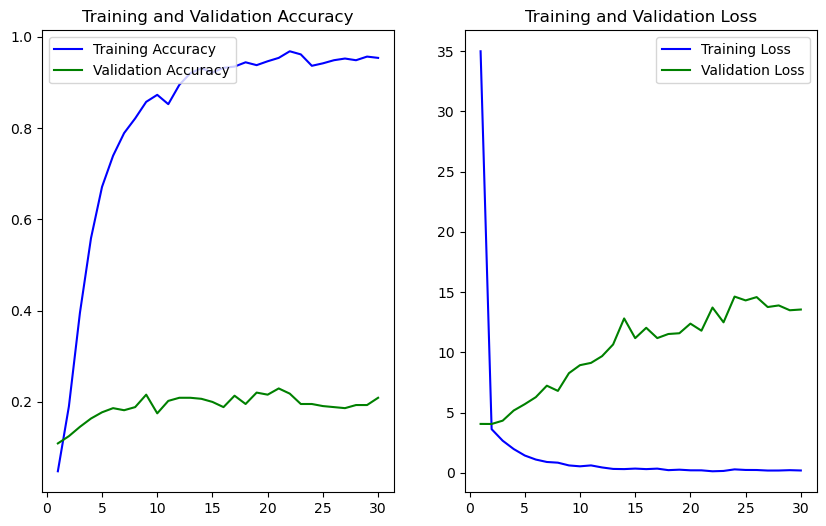

In [32]:
plot_evaluation_model(history)

Da questi grafici si evince come già in poche iterazioni il modello sia andato in **overfitting**, ovvero si è adattato troppo ai dati di training, ma non è riuscito a generalizzare correttamente sui dati del validation set e di conseguenza sui dati di test.

Confermiamo quanto appreso dai grafici valutando il modello sul test set.

<h3><span style="color:#117777">5.6 - Valutazione del modello sul test set</span></h3>

Il **test set** contiente immagini fino ad ora sconosciute al modello. 

Valutiamo l'accuratezza relativa a questi dati.

In [33]:
test_loss, test_acc = model_simple_cnn.evaluate(test_ds, verbose=2)
print(test_acc)

14/14 - 1s - loss: 15.2943 - accuracy: 0.1932 - 1s/epoch - 81ms/step
0.1931818127632141


Il fatto che l'accuratezza sia molto bassa rispetto a quella raggiunta sul training set può dipende da vari fattori:

- Il dataset utilizzato non è sufficientemente grande e di qualità.
- Il numero di classificazioni è molto grande rispetto alle immagini fornite per ciascuna (in questo caso il problema è abbastanza ambizioso, in quanto si sta cercando di classificare 88 classi di minerali, con sole 50 immagini per ogni classe, suddivise in train, validation e test set).
- L'architettura scelta per la rete neurale non è abbastanza performante.

<h2><span style="color:#117777">6 - Aumento della profondità della CNN e inserimento data augmentation</span></h2>

<h3><span style="color:#117777">6.1 - Creazione e compilazione del modello</span></h3>

Proviamo a cambiare l'architettura del modello, aumentando la profondità della rete, aggiungendo dei livelli di "abbandono" e predisponendoci per introdurre operazioni di "aumento dei dati".

La nuova architettura sarà formata da:

- 1 strato di ingresso convolutivo di 32 filtri con finestre 3 x 3 e attivazione ReLU
- 1 strato MaxPooling con finestre 2 x 2 e strides 2 x 2 (velocità di traslazione di 2 pixel alla volta, sia in orizzontale che in verticale)
- 1 strato convolutivo di 64 filtri con finestre 3 x 3 e attivazione ReLU
- 1 strato MaxPooling con finestre 2 x 2 e strides 2 x 2
- 1 strato convolutivo di 128 filtri con finestre 3 x 3 e attivazione ReLU
- 1 strato MaxPooling con finestre 2 x 2 e strides 2 x 2
- 1 strato convolutivo di 256 filtri con finestre 3 x 3 e attivazione ReLU
- 1 strato MaxPooling con finestre 2 x 2 e strides 2 x 2
- 1 strato convolutivo di 512 filtri con finestre 3 x 3 e attivazione ReLU
- 1 strato MaxPooling con finestre 2 x 2 e strides 2 x 2
- 1 strato convolutivo di 1024 filtri con finestre 3 x 3 e attivazione ReLU
- 1 strato MaxPooling con finestre 2 x 2 e strides 2 x 2

- 1 strato di appiattimento delle immagini (Flatten)
- 1 strato di Dropout con tasso di abbandono 0.3
- 1 strato pienamente connesso con 2048 neuroni ReLU
- 1 strato di Dropout con tasso di abbandono 0.3
- 1 strato pienamente connesso con 1024 neuroni ReLU
- 1 strato di Dropout con tasso di abbandono 0.3
- 1 strato di uscita pienamente connesso di 88 neuroni softmax (uno per ciascuna gemma da classificare)


In [34]:
def create_model(input_shape, function_data_augmentation=None) : 
    model = models.Sequential()
    normalization_layer
    function_data_augmentation
    model.add(layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = input_shape, padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides = (2,2)))
    model.add(layers.Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides = (2,2)))
    model.add(layers.Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2,2)))
    model.add(layers.Conv2D(256, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2,2)))
    model.add(layers.Conv2D(512, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2,2)))
    model.add(layers.Conv2D(1024, (3, 3), activation = 'relu', padding = 'same'))
    model.add(layers.MaxPooling2D((2, 2), strides=(2,2)))
    
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(2048, activation = 'relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1024, activation = 'relu'))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(num_classes, activation = 'softmax'))
     
    return model
  

Definiamo delle funzioni che ci permettono di compilare il modello con l'utilizzo di altri ottimizzatori.

Gli ottimizzatori con cui si sono raggiunte le prestazioni migliori sono **RMSprop** ed Adamax, entrambi con un passo di apprendimento di 0.0001.

In [35]:
#Definiamo più ottimizzatori per valutare quello più adatto al nostro modello

def compile_model_Adamax(model, learning_rate):
    model.compile(
        optimizer=tf.keras.optimizers.Adamax(learning_rate=learning_rate),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy']
    )
    
def compile_model_RMSprop(model, learning_rate):
    model.compile(
        optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy']
    )
    
def compile_model_Adagrad(model, learning_rate):
    model.compile(
        optimizer=tf.keras.optimizers.Adagrad(learning_rate=learning_rate),
        loss=tf.keras.losses.SparseCategoricalCrossentropy(),
        metrics=['accuracy']
    )

In [36]:
model = create_model(input_shape)

In [37]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 220, 220, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 110, 110, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 110, 110, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 55, 55, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 55, 55, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 27, 27, 128)     

In [38]:
compile_model_RMSprop(model, 0.0001)

<h3><span style="color:#117777">6.2 - Addestramento del nuovo modello</span></h3>

Addestriamo il nuovo modello, ed introduciamo un **EarlyStopping**, che ci permette di interrompere l'addestramento se la funzione di costo calcolata sul validation set non migliora per un certo numero di iterazioni, in modo da prevenire l'overfitting.

Introduciamo anche la **ReduceLROnPlateau** che diminuisce il learning rate dell'ottimizzatore qualora la quantità monitorata non migliori per il numero di volte impostato.

In [39]:
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.1,                            
    patience=2, 
    min_lr=0.00001
)

In [40]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss', 
    patience=5
)

In [41]:
callback = [reduce_lr, early_stopping]
#callback = [early_stopping]

In [42]:
epochs = 25
history = fit_model(model, epochs, train_ds, val_ds, callback)

Epoch 1/25
110/110 [==============================] - 20s 134ms/step - loss: 4.9687 - accuracy: 0.0312 - val_loss: 3.7859 - val_accuracy: 0.1000 - lr: 1.0000e-04
Epoch 2/25
110/110 [==============================] - 14s 123ms/step - loss: 3.5129 - accuracy: 0.1304 - val_loss: 2.6436 - val_accuracy: 0.2636 - lr: 1.0000e-04
Epoch 3/25
110/110 [==============================] - 14s 125ms/step - loss: 2.8858 - accuracy: 0.2278 - val_loss: 2.1824 - val_accuracy: 0.3841 - lr: 1.0000e-04
Epoch 4/25
110/110 [==============================] - 14s 124ms/step - loss: 2.4819 - accuracy: 0.2895 - val_loss: 2.1042 - val_accuracy: 0.3864 - lr: 1.0000e-04
Epoch 5/25
110/110 [==============================] - 14s 126ms/step - loss: 2.1757 - accuracy: 0.3477 - val_loss: 1.9416 - val_accuracy: 0.4182 - lr: 1.0000e-04
Epoch 6/25
110/110 [==============================] - 14s 127ms/step - loss: 1.9734 - accuracy: 0.4102 - val_loss: 1.8314 - val_accuracy: 0.4750 - lr: 1.0000e-04
Epoch 7/25
110/110 [========

<h3><span style="color:#117777">6.3 - Valutazione del nuovo modello</span></h3>

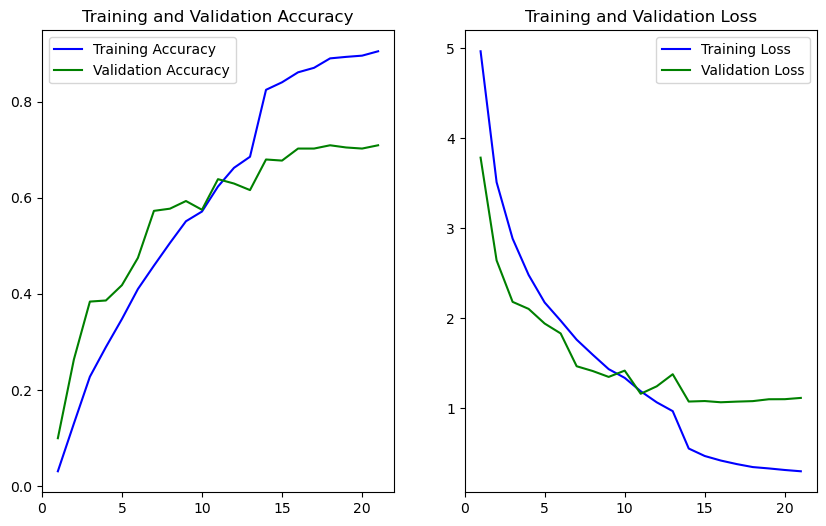

In [43]:
plot_evaluation_model(history)

**Valutiamo le prestazioni effettive sul test set**

In [44]:
test_loss, test_acc = model.evaluate(test_ds)
print(test_acc)

14/14 [==============================] - 1s 49ms/step - loss: 1.2862 - accuracy: 0.6682
0.668181836605072


**L'accuratezza del modello è nettamente migliorata e si aggira intorno al 65%**

<h3><span style="color:#117777">6.4 - Matrice di confusione</span></h3>

La matrice di confusione permette di individuare a "colpo d'occhio" per quali classi vengono commessi più errori.

Nel caso in esame la matrice è abbastanza grande e densa poichè le classi sono molto numerose, ma può comunque fornire informazioni utili per la comprensione dei risultati.

In [45]:
'''
Definiamo una funzione che a partire dal modello e dal dataset ci restituisce i numpy array contenenti:
le immagini date in pasto al modello
le etichette vere relative a tali immagini
le etichette predette dal modello per tali immagini
i valori di probabilità calcolati dalla softmax per tali immagini
'''

def get_dataset_evaluation_data(model, dataset):
    x_true = [] # Immagini che dovranno essere riconosciute
    y_true = [] # Etichette reali 
    y_predicted = [] # Etichette predette
    score = [] # Valori di probabilità restituiti dalla softmax

    for image, label in dataset:
        # Append etichette reali
        y_true.append(label)
        # Valuta le predizioni sull'immagine
        preds = model.predict(image,verbose=0)
        # Append etichette predette
        y_predicted.append(np.argmax(preds, axis = - 1))
        # Append immagini
        x_true.append(image)
        # Append score
        score.append(tf.nn.softmax(preds))

    # Conversione in numpy array
    y_true = np.concatenate([item.numpy() for item in y_true], axis = 0)
    x_true = np.concatenate([item for item in x_true])
    y_predicted = np.concatenate([item for item in y_predicted], axis = 0)
    score = np.concatenate([item for item in score])
    
    return x_true, y_true, y_predicted, score

def create_confusion_matrix(model, dataset):
    
    x_true, y_true, y_predicted, score = get_dataset_evaluation_data(model, dataset)

    # Confusion Matrix
    f,ax = plt.subplots(1,1,figsize = (20,20))
    cm = confusion_matrix(y_true, y_predicted)
    disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = class_names)
    disp.plot(cmap = plt.cm.Blues, xticks_rotation = 90, ax=ax)
    plt.show()

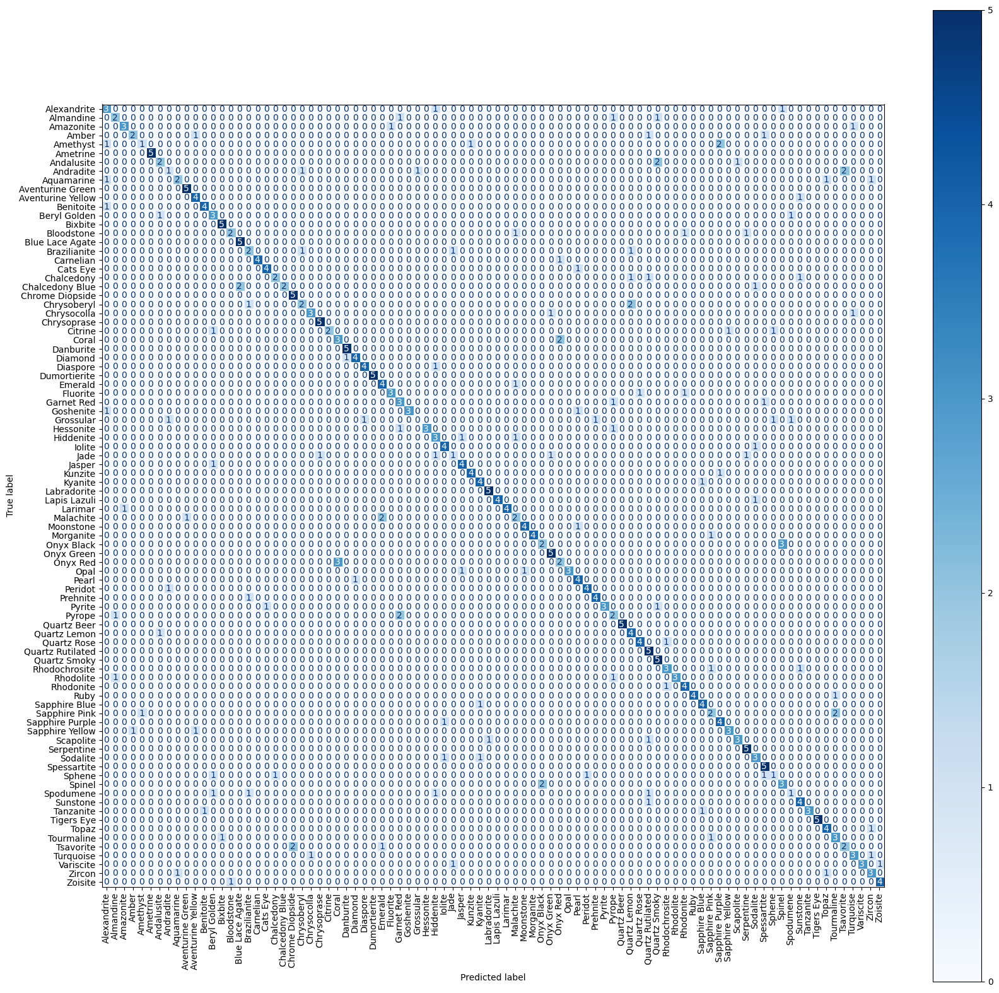

In [46]:
create_confusion_matrix(model, test_ds)

Oltre alla matrice di confusione, possiamo mostrare anche una serie di immagini prese dal test set, con il confronto tra la classificazione reale e quella predetta. Per farlo utilizziamo un batch di immagini preso dal test_ds e ne valutiamo le predizioni.

In [47]:
def print_some_prediction(model, dataset):
    image_batch, label_batch = dataset.as_numpy_iterator().next()
    predictions = model.predict_on_batch(image_batch)

    class_predictions = []
    for i in predictions:
        class_prediction = np.argmax(i)
        class_predictions.append(class_prediction)
        
    
    plt.figure(figsize=(30,50), dpi=100)
    for i in range(len(class_predictions)):
        ax = plt.subplot(8, 4, i+1)
        isPredictionTrue = class_names[class_predictions[i]] == class_names[label_batch[i]]
        title_color = "#aa1100" if not isPredictionTrue else "#22aa55"
        plt.imshow(image_batch[i].astype("uint8"))
        plt.title("Prediction: "+class_names[class_predictions[i]]+"\nLabel: "+class_names[label_batch[i]], color=title_color, fontsize = 20)
        plt.axis("off")

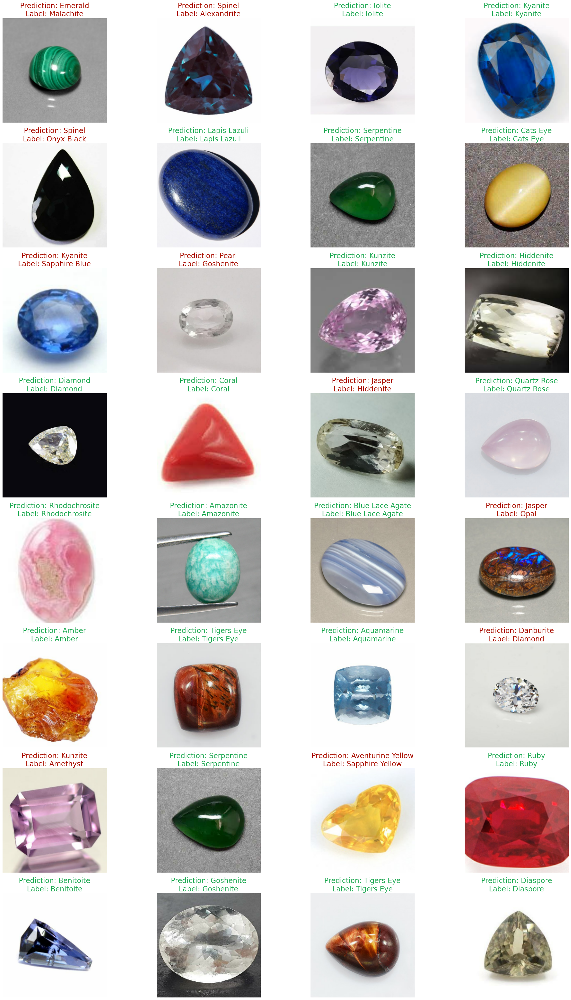

In [48]:
print_some_prediction(model, test_ds)

<h3><span style="color:#117777">6.5 - Previsione su nuovi dati</span></h3>

Il modello appena creato può essere utilizzato per effettuare previsioni su nuove immagini, "estranee" al dataset.

In [49]:
def predict_new_image(image_path, img_height, img_width, model):
    
    gem_path = image_path

    img = tf.keras.utils.load_img(gem_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
     
    plt.figure(figsize=(2,2)) 
    plt.imshow(img)
    plt.axis('off')

    predictions = model.predict(img_array, verbose = 0)
    score = tf.nn.softmax(predictions[0])

    print("L'immagine è stata classificata come: {}".format(class_names[np.argmax(score)]) )

L'immagine è stata classificata come: Pyrope


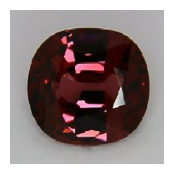

In [51]:
predict_new_image('granato.jpg', img_height, img_width, model)

<h2><span style="color:#117777">7 - Espansione dei dati tramite data augmentation</span></h2>

<h3><span style="color:#117777">7.1 - Compilazione, addestramento e valutazione del modello </span></h3>

Considerate le piccole dimensioni del dataset, proviamo ad aumentare il numero di campioni in maniera artificiosa. 
Grazie ai livelli di preelaborazione di Keras, possiamo applicare trasformazioni casuali, come ad esempio operazioni di zoom, rotazione, ribaltamento, aumento/diminuzione del contrasto ecc direttamente nella definizione del modello. 

In realtà dai vari esperimenti empirici provati, ci rendiamo conto che per il tipo di immagini utilizzate, questo tipo di operazioni porta benefici alquanto trascurabili.

**Anche addestrare la rete sul dataset ottenuto togliendo lo sfondo da tutte le immagini e trasformandolo in sfondo bianco (o grigio) o ritagliando le immagini intorno ai bordi della gemma, non ha portato alcun beneficio per quanto concerne le prestazioni.**

In [52]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal_and_vertical"),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2),
    ]
)

data_augmentation_contrast = keras.Sequential(
    [ 
        layers.RandomFlip('horizontal_and_vertical'),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2),
        layers.RandomContrast(0.2)
    ]
)

In [53]:
model_data_augmentation = create_model(input_shape, data_augmentation)
compile_model_RMSprop(model_data_augmentation, 0.0001)

In [54]:
epochs = 25
history = fit_model(model_data_augmentation, epochs, train_ds, val_ds, callback)

Epoch 1/25
110/110 [==============================] - 17s 128ms/step - loss: 4.8314 - accuracy: 0.0455 - val_loss: 3.4429 - val_accuracy: 0.1341 - lr: 1.0000e-04
Epoch 2/25
110/110 [==============================] - 14s 126ms/step - loss: 3.3611 - accuracy: 0.1423 - val_loss: 2.6167 - val_accuracy: 0.2682 - lr: 1.0000e-04
Epoch 3/25
110/110 [==============================] - 14s 127ms/step - loss: 2.7415 - accuracy: 0.2375 - val_loss: 2.2405 - val_accuracy: 0.3250 - lr: 1.0000e-04
Epoch 4/25
110/110 [==============================] - 14s 126ms/step - loss: 2.3650 - accuracy: 0.3085 - val_loss: 1.9602 - val_accuracy: 0.4227 - lr: 1.0000e-04
Epoch 5/25
110/110 [==============================] - 14s 125ms/step - loss: 2.0938 - accuracy: 0.3713 - val_loss: 1.8093 - val_accuracy: 0.4568 - lr: 1.0000e-04
Epoch 6/25
110/110 [==============================] - 14s 124ms/step - loss: 1.8676 - accuracy: 0.4310 - val_loss: 1.4962 - val_accuracy: 0.5523 - lr: 1.0000e-04
Epoch 7/25
110/110 [========

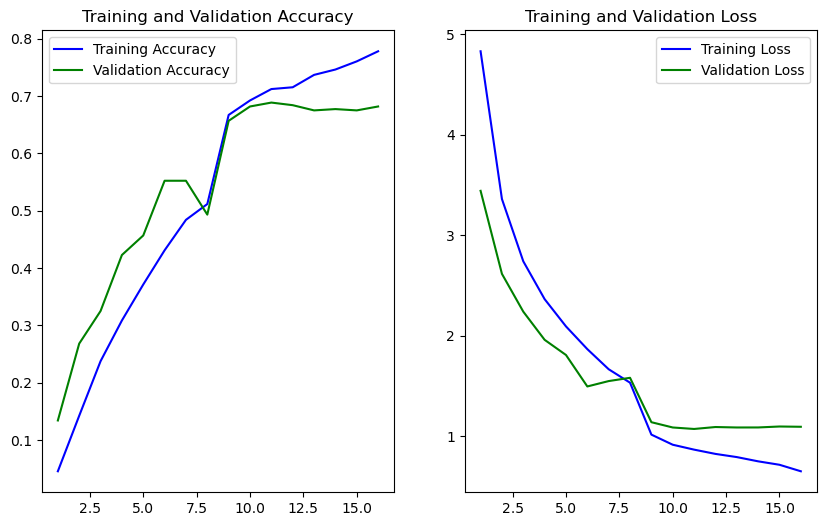

In [55]:
plot_evaluation_model(history)

In [56]:
test_loss, test_acc = model_data_augmentation.evaluate(test_ds)
print(test_acc)

14/14 [==============================] - 2s 88ms/step - loss: 1.2478 - accuracy: 0.6341
0.6340909004211426


<h2><span style="color:#117777">8 - Valutazione del modello con altre metriche</span></h2>

<h3><span style="color:#117777">8.1 - Utilizzo della top-k accuracy</span></h3>

La **top-k accuracy** è un'altra metrica, variazione dell'accuracy standard, che è possibile usare in caso di classificazione multiclasse con un alto numero di classi. 
K è convenzionalmente un numero intero positivo, come 3 o 5, che individua le prime k predizioni per un dato elemento, in ordine di score. Una volta fissato k, una predizione sarà considerata corretta ai fini del calcolo di questa metrica se ricade nelle prime **k posizioni**. Proveremo a calcolare l'accuratezza sia utilizzando k=3, che nel caso di k=5. 

Nel caso di una classificazione su quasi 90 classi diverse, questa è non solo una tecnica utilizzabile nel restituire l'output (in un sistema reale è possibile che venga mostrata una serie di alternative anziché una singola risposta), ma anche una prova in più a supporto del fatto che alcune gemme siano così visivamente simili da essere classificate nelle primissime posizioni con **score molto vicini** tra loro, dimostrando che spesso, a fronte di una predizione sbagliata, la risposta corretta si trova subito dopo, in seconda o massimo terza posizione.

Analizziamo, quindi, come l'accuratezza del modello varia utilizzando tale metrica.

In [57]:
from sklearn.metrics import top_k_accuracy_score

In [58]:
x_true, y_true, y_predicted, score = get_dataset_evaluation_data(model, test_ds)

In [59]:
top_k_accuracy_score(y_true, score, k=1)

0.6681818181818182

In [60]:
top_k_accuracy_score(y_true, score, k=3)

0.8886363636363637

In [61]:
top_k_accuracy_score(y_true, score, k=5)

0.9454545454545454

L'accuracy calcolata sulle prima 3 posizioni in questo modo sale di più di **20 punti percentuali**, indicando che la rete, in più della metà degli errori commessi sul primo risultato, ha comunque inserito il risultato giusto nelle due posizioni seguenti. Questo prova che alcune gemme sono così simili da risultare indistinguibili e difficili da classificare tanto per l'occhio umano quanto per la CNN. Con k = 5, e quindi calcolando la top-5 accuray, si sale fino al **93%** circa.

Per visualizzare meglio quanto discusso finora è possibile costruire un grafico contenente le immagini oggetto della predizione e le immagini delle gemme classificate nelle prime 3 posizioni per score, prese dal campionario costruito precedentemente.

Questo permette di rendersi conto delle forti somiglianze esistenti tra alcuni tipi di gemme.

In [62]:
top_accuracy = 5

In [63]:
def top_k_accuracy_visualization(num_print, top_accuracy, x_true, y_true, y_predicted, score, class_names, campionario):
    f, axs = plt.subplots(nrows=num_print, ncols=top_accuracy+1, figsize=(20,50))
    for i in range(num_print):
        y_pred_label = class_names[y_predicted[i]] # Etichetta predetta i-esima immagine 
        y_true_label = class_names[y_true[i]] # Etichetta reale i-esima immagine
        score_img = score[i] # Contiene tutte le probabilità con cui ogni label corrisponde ad una certa immagine
        score_img_top = score_img.copy()
        score_img_top = np.argsort(score_img_top)[::-1][:top_accuracy]
        axs[i,0].axis("off")
        axs[i,0].imshow(x_true[i].astype("uint8"))
        axs[i,0].set_title('Immagine esaminata:\n ' + y_true_label)
        for j in range(1, top_accuracy+1):
            label = class_names[score_img_top[j-1]]
            isPredictionTrue = score_img_top[j-1] == y_true[i]      
            img = campionario[label]
            title_color = "#aa1100" if not isPredictionTrue else "#22aa55"
            axs[i,j].axis("off")
            axs[i,j].imshow(img)
            axs[i,j].set_title("Predizione " + str(j) + ':\n' + label, color=title_color)
    plt.show()

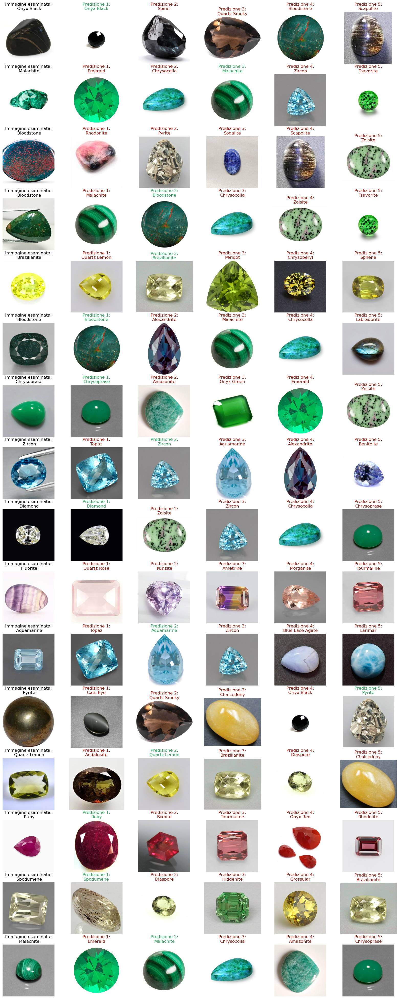

In [64]:
num_images_to_show = 16
top_k_accuracy_visualization(num_images_to_show, top_accuracy, x_true, y_true, y_predicted, score, class_names, campionario)

Anche in questo caso possiamo effettuare delle predizioni su nuove immagini, facendo in modo che il modello ci restituisca non solo l'etichetta con la probabilità più alta, ma anche le due seguenti.

In [65]:
def getLabelsFromIndexes(class_names, indexes):
    return [class_names[i] for i in indexes]

In [66]:
def predict_new_image_top_k_accuracy(image_path, img_height, img_width, model):
    
    gem_path = image_path

    img = tf.keras.utils.load_img(gem_path, target_size=(img_height, img_width))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)
    
    plt.figure(figsize=(2,2))
    plt.imshow(img)
    plt.axis('off')

    predictions = model.predict(img_array, verbose = 0)
    
    score = tf.nn.softmax(predictions[0])
    
    scorenp = np.array(score)
    copy_score = scorenp.copy()
    copy_score = np.argsort(copy_score)
    copy_score = copy_score[::-1][:3] 

    print("In ordine di probabilità l'immagine è stata classificata come: {}".format(getLabelsFromIndexes(class_names, copy_score)))

In ordine di probabilità l'immagine è stata classificata come: ['Pyrope', 'Garnet Red', 'Almandine']


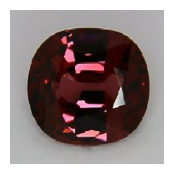

In [67]:
predict_new_image_top_k_accuracy('granato.jpg', img_height, img_width, model)

<h2><span style="color:#117777">Conclusioni</span></h2>

Dopo vari test empirici possiamo dire che il modello costruito, in combinazione con gli iperparametri utilizzati, è quello che ha fornito i risultati migliori.

Operazioni come data augmentation, rimozione dello sfondo dalle immagini e ritaglio delle immagini lungo i bordi non hanno apportato benefici in fase di addestramento del modello, questo mostra che la CNN riesce a rilevare già in maniera automatica le caratteristiche rileanti delle immagini su cui viene addestrata.

Rispetto all'obiettivo iniziale i risultati ottenuti sono in linea con le aspettative, e permettono di classificare gli 88 tipi di minerali analizzati in modo abbastanza affidabile, soprattutto nell'ipotesi di un sistema che restituisca le 3 ipotesi più probabili piuttosto che una singola predizione.

Come precedentemente discusso, la CNN è costruita per funzionare come l'occhio umano ed a supporto di questo possiamo dire che il modello evidenzia limiti molto simili a quelli che avrebbe un normale osservatore.
Difatti come per lui è difficile distinguere pietre dai colori e dai riflessi simili senza conoscere dati aggiuntivi (ad esempio durezza della scala Mohs, rifrazione della luce, ecc.), anche la rete costruita tende ad accomunare gemme visivamente molto simili.

Un ulteriore limite è dato da proprietà caratteristiche di un insieme ristretto di pietre, come ad esempio la cangianza dell'alessandrite, che la porta ad assumere due colori diversi a seconda che sia esposta a luce naturale od artificiale. Questo tipo di caratteristiche tendono a confondere il sistema ed a sviare le predizioni.

Anche l'arricchimento e la pulizia del dataset hanno avuto un ruolo importante, poichè hanno permesso di lavorare su dati completamente normalizzati, più numerosi ed in generale di maggior qualità, raggiungendo anche picchi di accuratezza del 65%-67%, che con il dataset originale non sarebbero stati possibili in nessun caso.

In conclusione, considerando che in un modello totalmente aleatorio, la probabilità di classificare correttamente una gemma è pari a: $$\frac{1}{88} = 1,13\% $$

mentre l'accuratezza ottenuta dal modello costruito è pari a circa il $65\%$ utilizzando la top 1-accuracy e a circa l' $85 \%$ considerando le prime 3 predizioni più probabili, possiamo dire che il sistema sta apprendendo correttamente. 

Un maggior numero di esempi permetterebbe probabilmente di ottenere risultati ancora migliori.
